In [2]:
import math

import matplotlib.pyplot as plt
import librosa.feature
import librosa.display
import numpy as np
from IPython.display import Audio, display
from sklearn.cluster import KMeans
from sklearn.preprocessing import StandardScaler
import ruptures as rpt  # our package
import IPython.display as ipd
import pandas as pd


In [3]:
def fig_ax(figsize=(15, 5), dpi=150):
    """Return a (matplotlib) figure and ax objects with given size."""
    return plt.subplots(figsize=figsize, dpi=dpi)

Loaded signal with shape: (4980948,), Sampling rate: 44100


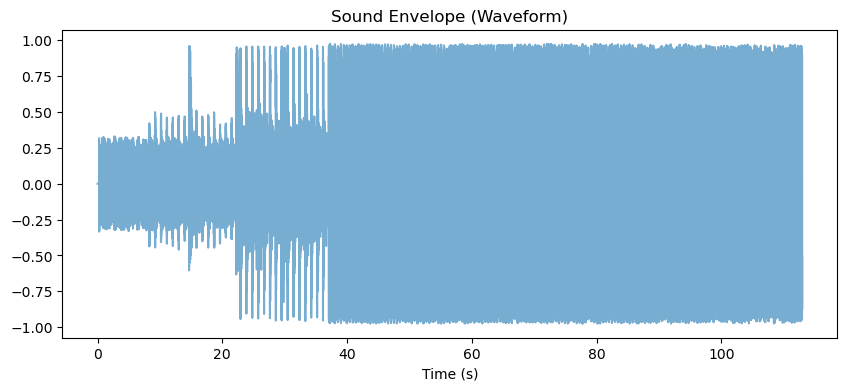

In [15]:
# GET THE SONG DURATION BY FILE
y, sr = librosa.load(r"DO NOT TOUCH/Audio Files/Emmanuel/01. Vitalic.flac",sr=None)
durationOfSong = librosa.get_duration(y=y, sr=sr)

signal, sr = librosa.load(
    r"DO NOT TOUCH/Audio Files/Emmanuel/66. Vitalic - The Light Is a Train.flac",
    sr = None,                                                                      # <-- CAN BE CHANGED :))
    duration=durationOfSong
)

print(f"Loaded signal with shape: {signal.shape}, Sampling rate: {sr}")

# listen to the music
display(Audio(data=signal, rate=sr))

# Plot waveform
time = np.arange(len(signal)) / sr
plt.figure(figsize=(10, 4))
plt.plot(time, signal, alpha=0.6)
plt.xlabel("Time (s)")
plt.title("Sound Envelope (Waveform)")
plt.show()

In [38]:
tempo, beats = librosa.beat.beat_track(y=y, sr=sr)
print("tempo", tempo)

beattimestamps = librosa.frames_to_time(beats, sr=sr)
print("beats", beattimestamps)

tempo, beats_dense = librosa.beat.beat_track(y=y, sr=sr, sparse=False)

onset_env = librosa.onset.onset_strength(y=y, sr=sr,
                                         aggregate=np.median)
tempo, beats = librosa.beat.beat_track(onset_envelope=onset_env,
                                       sr=sr)


tempo [109.95678191]
beats [  1.2306576    1.75310658   2.22911565   2.7631746    3.27401361
   3.87773243   4.52789116   5.03873016   5.51473923   6.04879819
   6.66412698   7.17496599   7.80190476   8.40562358   8.91646259
   9.40408163   9.99619048  10.62312925  11.261678    11.88861678
  12.51555556  13.13088435  13.75782313  14.3847619   14.97687075
  15.59219955  16.2307483   16.82285714  17.43818594  18.04190476
  18.63401361  19.23773243  19.85306122  20.41034014  20.990839
  21.57133787  22.12861678  22.67428571  23.26639456  23.80045351
  24.34612245  24.89179138  25.42585034  25.9599093   26.52879819
  27.07446712  27.62013605  28.16580499  28.68825397  29.2339229
  29.80281179  30.34848073  30.89414966  31.43981859  31.98548753
  32.53115646  33.06521542  33.61088435  34.15655329  34.70222222
  35.24789116  35.80517007  36.32761905  36.87328798  37.44217687
  37.97623583  38.53351474  39.0675737   39.61324263  40.13569161
  40.71619048  41.25024943  41.80752834  42.35319728

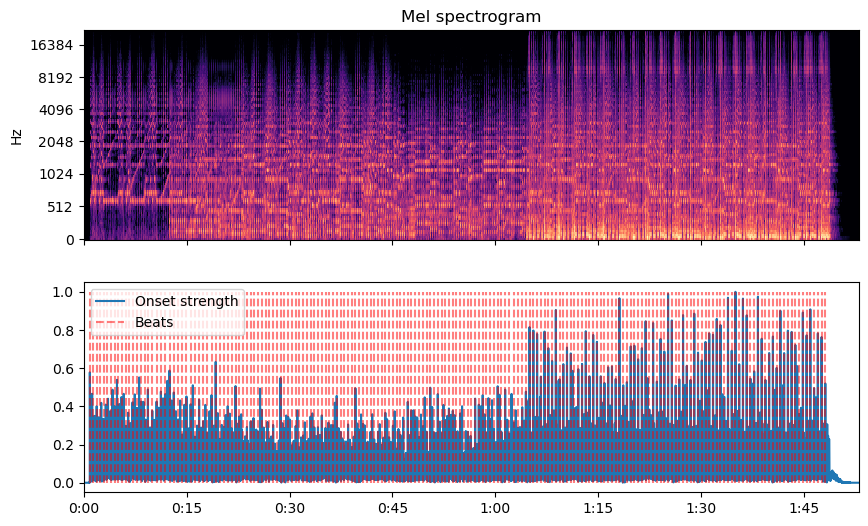

In [43]:
import matplotlib.pyplot as plt
hop_length = 512

# Compute features
onset_env = librosa.onset.onset_strength(y=y, sr=sr, hop_length=hop_length)
times = librosa.times_like(onset_env, sr=sr, hop_length=hop_length)
M = librosa.feature.melspectrogram(y=y, sr=sr, hop_length=hop_length)
beats = librosa.beat.beat_track(onset_envelope=onset_env, sr=sr, hop_length=hop_length)[1]

# Plot
fig, ax = plt.subplots(nrows=2, sharex=True, figsize=(10, 6))

# Mel spectrogram
librosa.display.specshow(librosa.power_to_db(M, ref=np.max),
                         y_axis='mel', x_axis='time', hop_length=hop_length,
                         sr=sr, ax=ax[0])
ax[0].set(title='Mel spectrogram')
ax[0].label_outer()

# Onset strength
ax[1].plot(times, librosa.util.normalize(onset_env),
           label='Onset strength')
ax[1].vlines(times[beats], 0, 1, alpha=0.5, color='r',
             linestyle='--', label='Beats')
ax[1].legend()

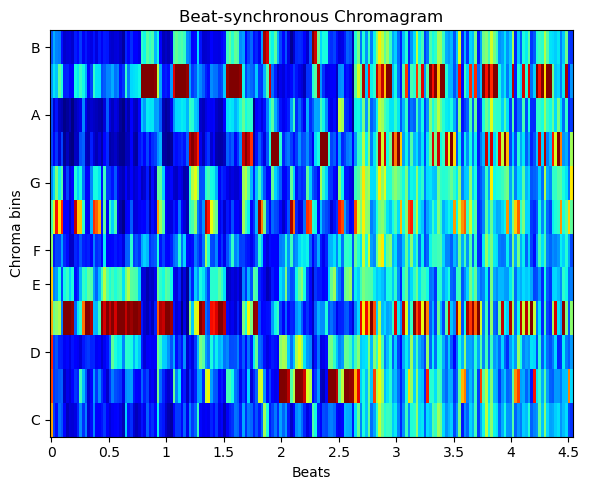

Tempo: {:.2f} BPM [109.95678191]
Beats (in frames): [  77  122  164  207  249  293  338  390  434  478  530  574  617  669
  724  767  810  861  915  970 1024 1078 1131 1185 1239 1290 1343 1397
 1449 1502 1554 1605 1657 1709 1758 1808 1858 1906 1953 2003 2049 2096
 2141 2189 2236 2285 2331 2378 2425 2471 2518 2567 2614 2661 2707 2755
 2801 2848 2895 2941 2989 3036 3081 3128 3176 3225 3271 3319 3365 3411
 3457 3507 3553 3601 3647 3695 3741 3788 3834 3882 3928 3976 4022 4068
 4114 4163 4210 4258 4304 4351 4397 4445 4492 4540 4586 4634 4679 4728
 4774 4822 4867 4914 4960 5009 5055 5104 5149 5197 5243 5291 5344 5398
 5450 5504 5551 5597 5645 5692 5739 5785 5833 5880 5927 5974 6021 6067
 6114 6161 6209 6256 6303 6349 6396 6444 6491 6537 6585 6632 6679 6725
 6773 6820 6867 6913 6960 7007 7054 7101 7148 7196 7243 7289 7336 7383
 7430 7477 7524 7572 7618 7665 7712 7759 7806 7853 7900 7947 7994 8041
 8088 8135 8182 8229 8276 8323 8370 8417 8464 8511 8558 8605 8652 8699
 8746 8793 8840 8887 8934

In [46]:
## BEAT CHROMA ##
chroma = librosa.feature.chroma_cqt(y=y, sr=sr, hop_length=hop_length)

onset_env = librosa.onset.onset_strength(y=y, sr=sr, hop_length=hop_length)
tempo, beats = librosa.beat.beat_track(onset_envelope=onset_env, sr=sr, hop_length=hop_length)

# Synchronize chroma with beat frames
beat_chroma = librosa.util.sync(chroma, beats, aggregate=np.mean)

# Plot
plt.figure(figsize=(6, 5))
librosa.display.specshow(beat_chroma, x_axis='time', y_axis='chroma', cmap='jet')
plt.xlabel('Beats')
plt.ylabel('Chroma bins')
plt.title('Beat-synchronous Chromagram')
plt.tight_layout()
plt.show()

# Print detected beats and tempo
print("Tempo: {:.2f} BPM", tempo)
print("Beats (in frames):", beats)
print("Beats (in time):", librosa.frames_to_time(beats, sr=sr, hop_length=hop_length))



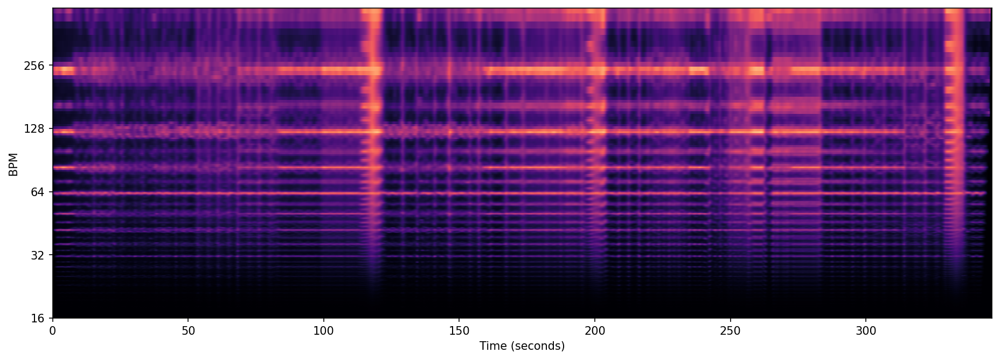

In [4]:
# Compute the onset strength
hop_length_tempo = 512                                                                       # <-- CAN BE CHANGED :))
oenv = librosa.onset.onset_strength(
    y=signal, sr=sr, hop_length=hop_length_tempo
)
# Compute the tempogram
tempogram = librosa.feature.tempogram(
    onset_envelope=oenv,
    sr=sr,
    hop_length=hop_length_tempo,
)
# Display the tempogram
fig, ax = fig_ax()
_ = librosa.display.specshow(
    tempogram,
    ax=ax,
    hop_length=hop_length_tempo,
    sr=sr,
    x_axis="s",
    y_axis="tempo",
)

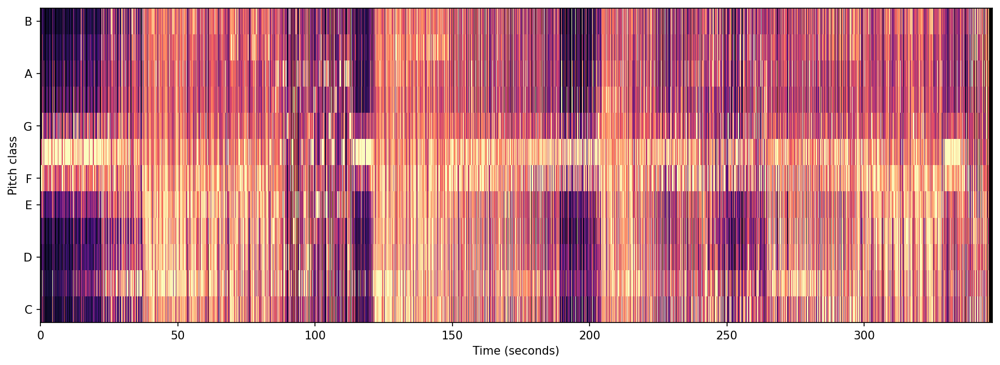

In [5]:
# Compute the Chromagram
# Extract chroma features (try chroma_cqt or chroma_cens)
chroma = librosa.feature.chroma_stft(y=signal, sr=sr, n_chroma=12)                       # <-- CAN BE CHANGED :))  - Go into the packages.. im sorry..

# Normalize chroma features
chroma = librosa.util.normalize(chroma, axis=1)                       # <-- see if this does anything

# Transpose to shape (time_steps, features)
chroma_T = chroma.T  # shape: (frames, 12)

# Display the tempogram
fig, ax = fig_ax()
_ = librosa.display.specshow(
    chroma,
    ax=ax,
    hop_length=hop_length_tempo,
    sr=sr,
    x_axis="s",
    y_axis="chroma",
)

Detected change points: [  1.17260771   7.8831746   23.23156463  37.67437642  52.82539683
  67.9415873   83.22031746  99.13759637 113.67328798 119.54793651
 145.42657596 156.40961451 166.47546485 186.90902494 196.77750567
 202.02521542 221.52997732 234.77696145 242.28861678 249.1385034
 255.46594104 262.74539683 272.7415873  283.82911565 298.14421769
 313.53904762 329.01514739 335.79537415 343.95718821 346.56943311]


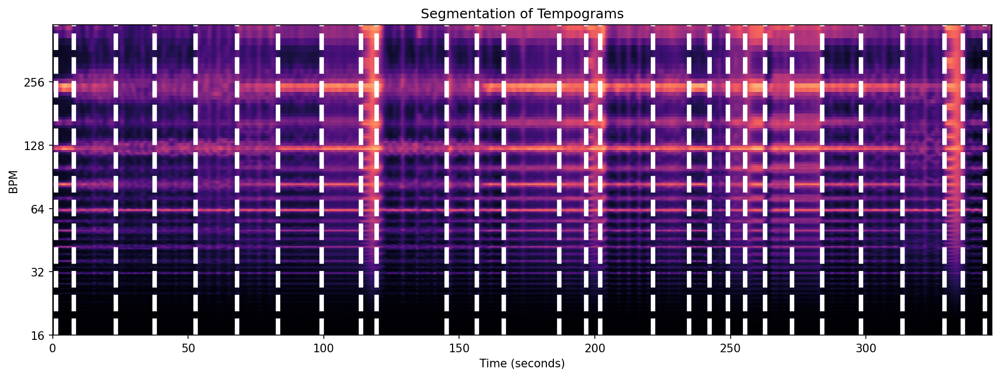

In [6]:
# Choose detection method TEMPOGRAMS
algoTEM = rpt.KernelCPD(kernel="linear").fit(tempogram.T)                        # <-- CAN BE CHANGED :))

# === TEMPO ALGORITHM NUMBER OF DESIRED CHANGES (bkps) ===
n_bkps = 40                                                                    # <-- CAN BE CHANGED :))
bkpsTEM = algoTEM.predict(n_bkps=n_bkps)
bkps_timesTEM = librosa.frames_to_time(bkpsTEM, sr=sr, hop_length=512)


# === Ensure segments are at least desired seconds apart ===
min_segment_length = 4  # in seconds
filtered_bkps_times = [bkps_timesTEM[0]]  # Always keep the first change point
for b in bkps_timesTEM[1:]:
    if b - filtered_bkps_times[-1] >= min_segment_length:
        filtered_bkps_times.append(b)

# Ensure the final segment reaches the end
if filtered_bkps_times[-1] != bkps_timesTEM[-1]:
    filtered_bkps_times.append(bkps_timesTEM[-1])

# Use filtered breakpoints
bkps_timesTEM = np.array(filtered_bkps_times)

# Now bkps contains the detected change points
print(f"Detected change points: {bkps_timesTEM}")

# Displaying results
fig, ax = fig_ax()
_ = librosa.display.specshow(
    tempogram,
    label= "Segmentation of Tempograms",
    ax=ax,
    x_axis="s",
    y_axis="tempo",
    hop_length=hop_length_tempo,
    sr=sr,
)
# Add title
ax.set_title("Segmentation of Tempograms")

# === TEMPO IS WHITE LINES ===
for b in bkps_timesTEM[:-1]:
    ax.axvline(b, ls="--", color="white", lw=4)

Detected change points: [2.43809524e-01 1.43499320e+01 2.22214966e+01 3.71287075e+01
 5.29182766e+01 6.74191383e+01 8.40562358e+01 9.87080272e+01
 1.04907755e+02 1.10039365e+02 1.21173333e+02 1.49768707e+02
 1.73998730e+02 1.89045261e+02 2.02431565e+02 2.22992834e+02
 2.35508390e+02 2.48383855e+02 2.57219048e+02 2.63918005e+02
 2.83178957e+02 2.99328435e+02 3.13086259e+02 3.28214059e+02
 3.36503583e+02 3.45652245e+02 3.46569433e+02]


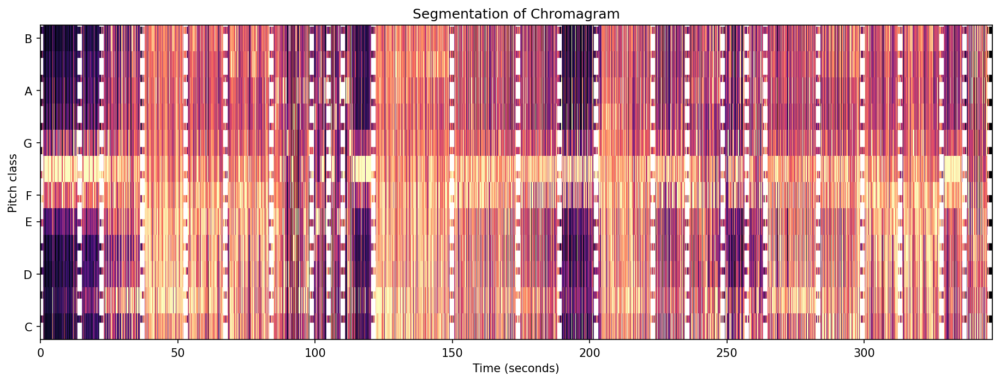

In [7]:
# Choose detection method CHROMAGRAMS
algoCH = rpt.KernelCPD(kernel="rbf").fit(chroma_T)                            # <-- CAN BE CHANGED :))

# === CHROMA ALGORITHM NUMBER OF DESIRED CHANGES (bkps) ===
bkpsCH = algoCH.predict(n_bkps=n_bkps)
bkpsCH_times = librosa.frames_to_time(bkpsCH, sr=sr, hop_length=hop_length_tempo)

# === Ensure segments are at least desired seconds apart ===
min_segment_lengthChroma = 5  # in seconds
filtered_bkpsCH_times = [bkpsCH_times[0]]  # Always keep the first change point
for b in bkpsCH_times[1:]:
    if b - filtered_bkpsCH_times[-1] >= min_segment_lengthChroma:
        filtered_bkpsCH_times.append(b)

# Ensure the final segment reaches the end
if filtered_bkpsCH_times[-1] != bkpsCH_times[-1]:
    filtered_bkpsCH_times.append(bkpsCH_times[-1])

# Use filtered breakpoints
bkpsCH_times = np.array(filtered_bkpsCH_times)

# Displaying results
fig, ax = fig_ax()
_ = librosa.display.specshow(
    chroma,
    ax=ax,
    x_axis="s",
    y_axis="chroma",
    hop_length=hop_length_tempo,
    sr=sr,
)
# Add title
ax.set_title("Segmentation of Chromagram")

# === CHROMA IS WHITE LINES ===
for b in bkpsCH_times[:-1]:
    ax.axvline(b, ls="--", color="white", lw=4)

print("Detected change points:", bkpsCH_times)

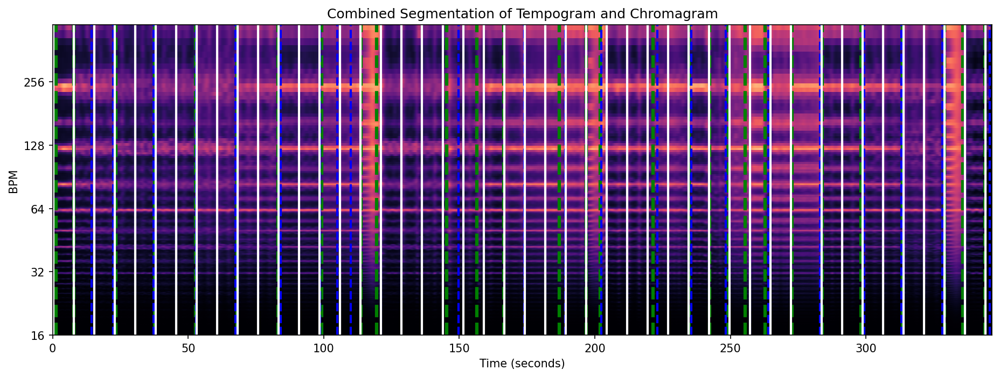

In [8]:
# === NOW COMPARE BOTH WITH GroundTruth ===
# Load GT only TIMESTAMPS
GT = "DO NOT TOUCH/GroundTruthData/GroundTruthRight/parsed_data_66.csv"
gt_data = pd.read_csv(GT)
gt_times = gt_data["TIMESTAMP"].values

# display the figure
fig, ax = fig_ax()
# Display the tempogram as the background
_ = librosa.display.specshow(
    tempogram,
    ax=ax,
    x_axis="s",
    y_axis="tempo",
    hop_length=hop_length_tempo,
    sr=sr,
)
# Title
ax.set_title("Combined Segmentation of Tempogram and Chromagram")


# === TEMPO IS GREEN LINES ===
for b in bkps_timesTEM[:-1]:
    ax.axvline(b, ls="--", color="green", lw=3, label="Tempo Segmentation" if b == bkps_timesTEM[0] else None)

# === CHROMA IS RED LINES ===
for b in bkpsCH_times[:-1]:
    ax.axvline(b, ls="--", color="blue", lw=2, label="Chromagram Segmentation" if b == bkpsCH_times[0] else None)

# === GroundTruth IS WHITE LINES ===
for b in gt_times:
    ax.axvline(b, ls="-", color="white", lw=2, label="Ground Truth" if b == gt_times[0] else None)
plt.show()


In [9]:
# === CALCULATES SCORE WITHIN 3s OF GT ====
def gaussian_score_flat_top(time_diff, sigma=0.9, flat_top=0.25):
    abs_diff = abs(time_diff)
    if abs_diff <= flat_top:
        return 100.0
    elif abs_diff >= 3:
        return 0.0
    else:
        adjusted_diff = abs_diff - flat_top
        return 100.0 * math.exp(- (adjusted_diff ** 2) / (2 * sigma ** 2))

# === Load ground truth from CSV ===
ground_truth_path = r"DO NOT TOUCH/GroundTruthData/GroundTruthRight/parsed_data_66.csv"
gt_times = pd.read_csv(ground_truth_path)['TIMESTAMP'].values  # Extract only 'TIMESTAMP' column

# === Scoring function ===
def evaluate_segmentation(predicted_times, gt_times, label=""):
    scores = []
    matched_preds = []

    for gt in gt_times:
        if len(predicted_times) == 0:
            scores.append(0.0)
            matched_preds.append(None)
            continue
        closest_pred = min(predicted_times, key=lambda p: abs(p - gt))
        matched_preds.append(closest_pred)
        time_diff = closest_pred - gt
        score = gaussian_score_flat_top(time_diff)
        scores.append(score)

    # === Print results ===
    print(f"\n--- Evaluation Results for {label} ---")
    for i, (gt, pred, score) in enumerate(zip(gt_times, matched_preds, scores), 1):
        if pred is not None:
            print(f"{i:02}: GT={gt:.2f}s | Closest Pred={pred:.2f}s | Diff={pred - gt:+.2f}s | Score={score:.2f}")
        else:
            print(f"{i:02}: GT={gt:.2f}s | Closest Pred=None | Diff=None | Score=0.00")

    avg_score = np.mean(scores)
    print(f"\nAverage Score for {label}: {avg_score:.2f}\n")
    return scores, avg_score

# === Evaluate TEMPO ===
tempo_scores, avg_tempo_score = evaluate_segmentation(bkps_timesTEM, gt_times, label="Tempo")

# === Evaluate CHROMAGRAM ===
chroma_scores, avg_chroma_score = evaluate_segmentation(bkpsCH_times, gt_times, label="Chromagram")



--- Evaluation Results for Tempo ---
01: GT=0.24s | Closest Pred=1.17s | Diff=+0.93s | Score=75.00
02: GT=7.80s | Closest Pred=7.88s | Diff=+0.08s | Score=100.00
03: GT=15.36s | Closest Pred=7.88s | Diff=-7.48s | Score=0.00
04: GT=22.92s | Closest Pred=23.23s | Diff=+0.31s | Score=99.75
05: GT=30.48s | Closest Pred=37.67s | Diff=+7.20s | Score=0.00
06: GT=38.04s | Closest Pred=37.67s | Diff=-0.36s | Score=99.23
07: GT=45.59s | Closest Pred=52.83s | Diff=+7.23s | Score=0.00
08: GT=53.15s | Closest Pred=52.83s | Diff=-0.33s | Score=99.62
09: GT=60.71s | Closest Pred=67.94s | Diff=+7.23s | Score=0.00
10: GT=68.27s | Closest Pred=67.94s | Diff=-0.33s | Score=99.60
11: GT=75.83s | Closest Pred=83.22s | Diff=+7.39s | Score=0.00
12: GT=83.39s | Closest Pred=83.22s | Diff=-0.17s | Score=100.00
13: GT=90.95s | Closest Pred=83.22s | Diff=-7.73s | Score=0.00
14: GT=98.51s | Closest Pred=99.14s | Diff=+0.63s | Score=91.49
15: GT=106.07s | Closest Pred=99.14s | Diff=-6.93s | Score=0.00
16: GT=113.